In [128]:
import napari
import numpy as np
import seaborn as sns
from napari.utils.notebook_display import nbscreenshot
from IPython.display import Image

# IMC data
### Working with Imaging Mass Cytometry (IMC) data
conv-paint can work with multi-channel data, which is demonstrated in this notebook on publicly available IMC dataset [Eling et. al (2022)](https://doi.org/10.5281/zenodo.5949116) with >40 channels.
In this tutorial, we will:
1. load and explore IMC data into napari using the [napari-IMC plugin](https://www.napari-hub.org/plugins/napari-imc)
2. annotate a structure of interest
3. train conv-paint on all channels of the dataset, to find regions in the sample that are similar to the annotated structure
4. load the segmentation from conv-paint into the jupyter notebook
4. extract some simple statistics using skimage and numpy
5. plot the results

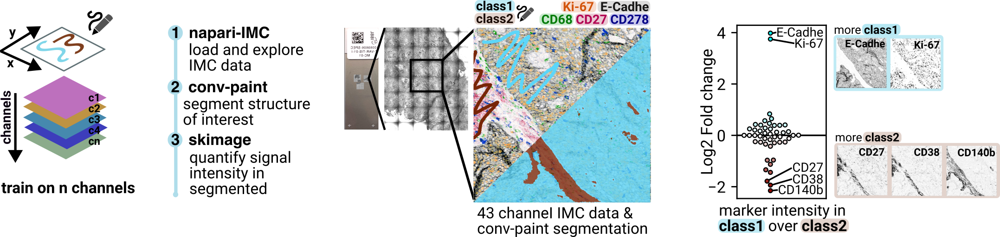

In [5]:
Image('../images/IMC_notebook_overview.png')

In [9]:
viewer = napari.Viewer()
viewer.window.add_plugin_dock_widget('napari-imc') #open the napari-imc plugin

/Users/luhin/miniforge3/envs/napari-env/lib/python3.9/site-packages/napari_tools_menu/__init__.py:165: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)


(<napari._qt.widgets.qt_viewer_dock_widget.QtViewerDockWidget at 0x2aa92a700>,
 <napari_imc.imc_widget.IMCWidget at 0x2aa925d30>)

Drag and drop the IMC data, e.g. `Patient1.mcd` downloaded from https://zenodo.org/records/5949116. You will see an overview of the whole slide.

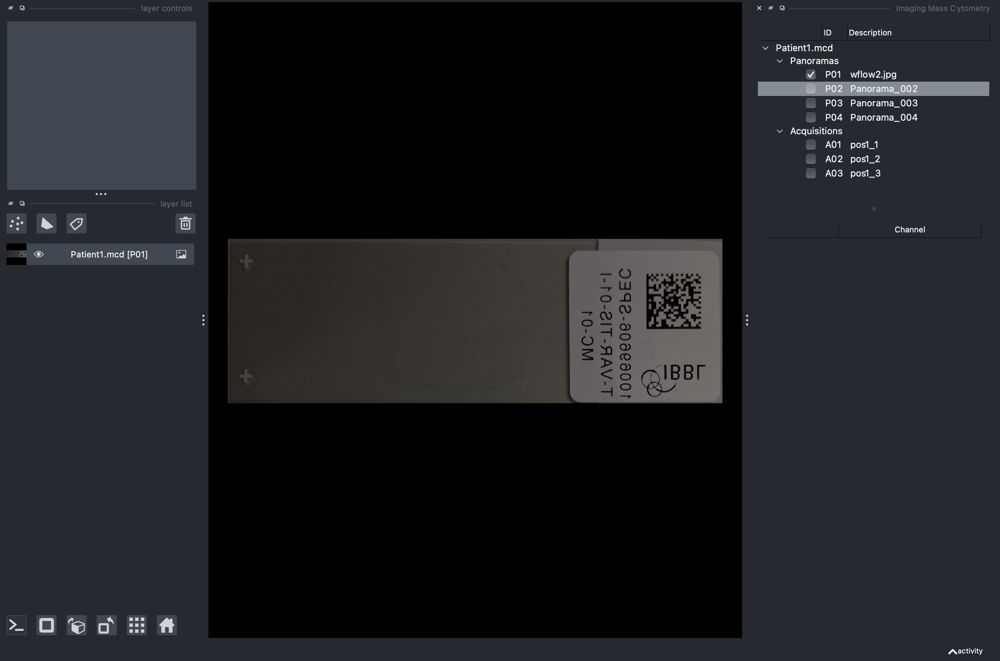

In [14]:
nbscreenshot(viewer)

- Check `Panorama_002` to load a higher magnification FOV.
- Check `pos1_1` to access the IMC data of one FOV.

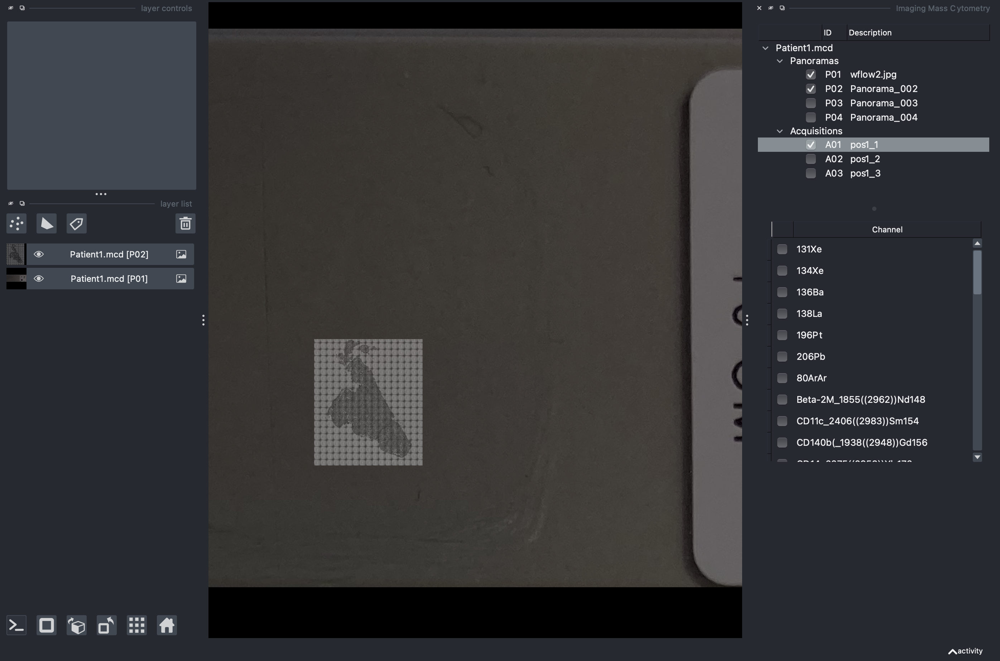

In [17]:
nbscreenshot(viewer)

- Now you can load the different channels for `pos1_1`.
- Delete both overview layers (`Patient1.mcd [P02]` and `Patient1.mcd [P02]`).
- Next we simplify the layer names (e.g. `Patient1.mcd [A01 Histone_126((2979))In113]` becomes `Histone`).

In [32]:
#get all the napari layer names
def get_layer_names(viewer):
    layer_names = []
    for i,layer in enumerate(viewer.layers):
        #extract everythin in [] and add to list
        if '[' in layer.name:
            name = layer.name.split('[')[1].split(']')[0][4:]
            #if there are () in the name, extract everything before the first (
            if '(' in name:
                name = name.split('(')[0]
            #if there are _ in the name, extract everything before the first _
            if '_' in name:
                name = name.split('_')[0]
            layer_names.append(name)

    return layer_names

def set_layer_names(viewer,layer_names):
    for i,layer in enumerate(viewer.layers):
        layer.name = layer_names[i]


layer_names = get_layer_names(viewer)
set_layer_names(viewer,layer_names)

layer_names[25:40] #show a subset of the layer names

['CD45RA',
 'CD45RO',
 'CD4',
 'CD68',
 'CD7',
 'CD8a',
 'Carboni',
 'DNA1',
 'DNA2',
 'E-Cadhe',
 'FOXP3',
 'Granzym',
 'HLA-DR',
 'Histone',
 'Indolea']

Next let's have a look at some of the channels. Play around with different colormaps and blending modes. Below is the code to reproduce the colors we've chosen to create the figure at the beginning of the document.

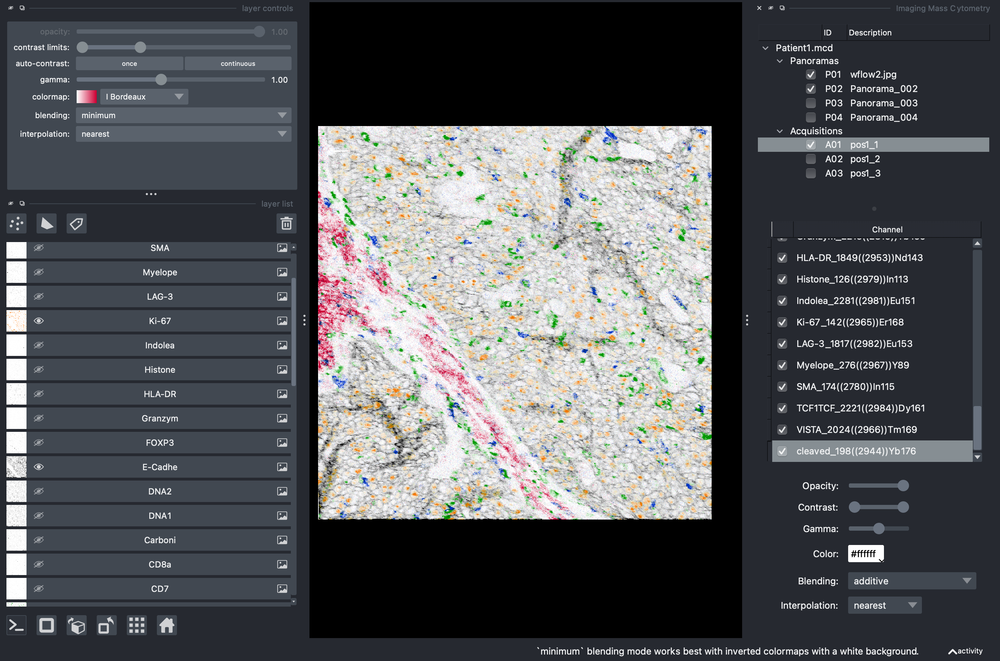

In [46]:
for i,layer in enumerate(viewer.layers):
    layer.visible = False 
    layer.colormap= 'gray_r'
    layer.blending= 'minimum'     
    
viewer.layers['Ki-67'].visible = True
viewer.layers['Ki-67'].colormap = 'I Orange'
viewer.layers['Ki-67'].contrast_limits = (0, 300)

viewer.layers['E-Cadhe'].visible = True
viewer.layers['E-Cadhe'].colormap = 'gray_r'
viewer.layers['E-Cadhe'].contrast_limits = (0, 200)

viewer.layers['CD68'].visible = True
viewer.layers['CD68'].colormap = 'I Forest'
viewer.layers['CD68'].contrast_limits = (0, 70)

viewer.layers['CD27'].visible = True
viewer.layers['CD27'].colormap = 'I Bordeaux'
viewer.layers['CD27'].contrast_limits = (0, 20)

viewer.layers['CD278'].visible = True
viewer.layers['CD278'].colormap = 'I Blue'
viewer.layers['CD278'].contrast_limits = (0, 20)

nbscreenshot(viewer)

- Next we open conv-paint to label and segment a structure of interest.
- To reproduce our results, you can load also load the mask from a file on github!
- To train conv-paint on a multichannel image, duplicate all the layers and merge them into a stack. Rename this new layer `stack`. The stack shoud have dimensions `[channels, x, y]`.

In [60]:
# to load the labels from disk:
#viewer.add_labels(np.load('../sample_data/imc_tutorial/annotations.npy'), name='annotations')

print(f"Dimensions of stack layer: {viewer.layers['stack'].data.shape}")

Dimensions of stack layer: (47, 600, 600)


Make sure that you have selected:
- Layer to segment: stack
- Data dimensions: Multichannel image

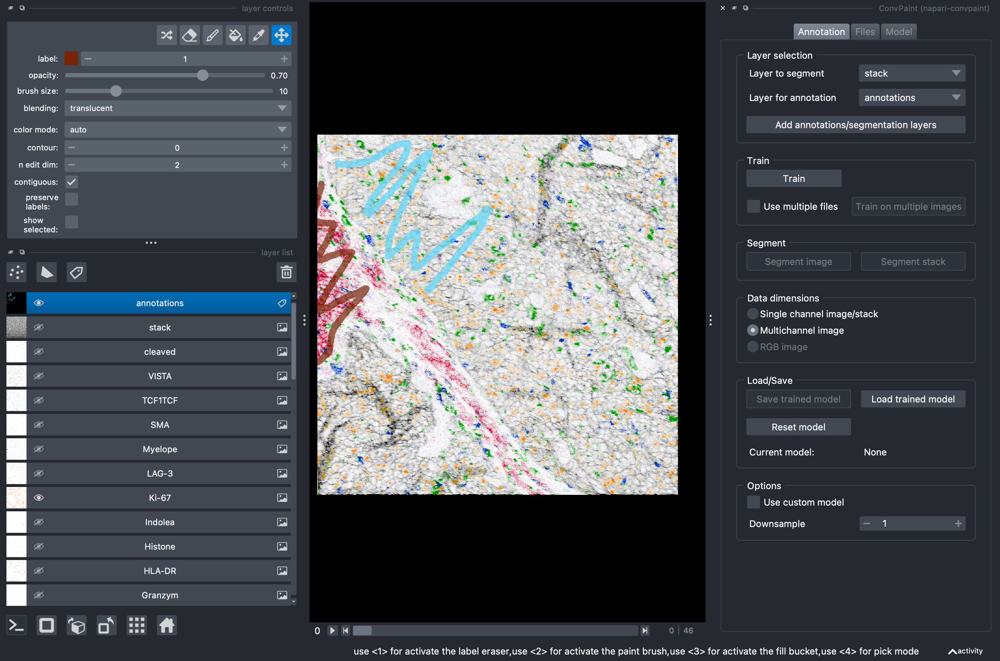

/Users/luhin/miniforge3/envs/napari-env/lib/python3.9/site-packages/napari/_vispy/layers/image.py:274: UserWarning: data shape (17756, 38101) exceeds GL_MAX_TEXTURE_SIZE 16384 in at least one axis and will be downsampled. Rendering is currently in 2D mode.
  warnings.warn(
/Users/luhin/miniforge3/envs/napari-env/lib/python3.9/site-packages/napari/_vispy/layers/image.py:274: UserWarning: data shape (17756, 38101) exceeds GL_MAX_TEXTURE_SIZE 16384 in at least one axis and will be downsampled. Rendering is currently in 2D mode.
  warnings.warn(


In [63]:
nbscreenshot(viewer)

Click on `Train`, then on `Segment image` and you will see the segmentation results.

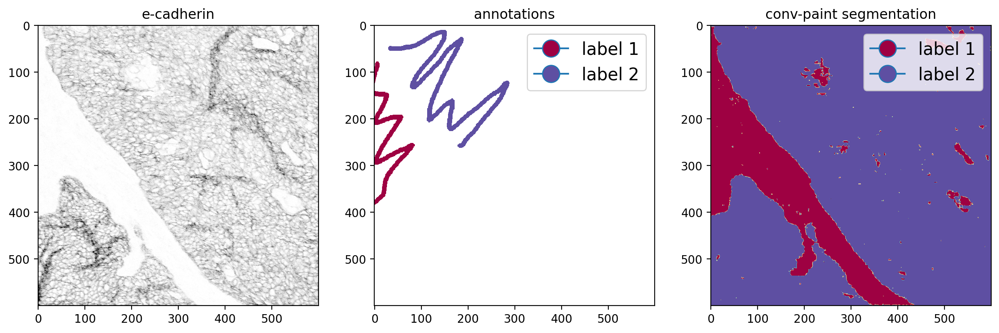

In [122]:
import matplotlib.pyplot as plt

#prepare the data for plotting
annot = viewer.layers['annotations'].data[:,:].copy().astype(float)
annot[annot==0] = np.nan

#function to get the color of a class for a given colormap
def get_color(x, cmap, vmin, vmax):
    norm = plt.Normalize(vmin, vmax)
    return cmap(norm(x))

#create the figure
fig, axes = plt.subplots(1, 3, figsize=(15, 5),dpi=200)
axes[0].imshow(viewer.layers['E-Cadhe'].data[:,:], cmap='gray_r', vmin=0, vmax=200)
axes[0].set_title('e-cadherin')
axes[1].imshow(annot, cmap='Spectral')
axes[1].set_title('annotations')
axes[2].imshow(viewer.layers['segmentation'].data[:,:], cmap='Spectral')
axes[2].set_title('conv-paint segmentation')

#add a legend to the annotation and prediction image
label_1_col = get_color(1, plt.cm.Spectral, 1, 2)
label_2_col = get_color(2, plt.cm.Spectral, 1, 2)
legend = ['label 1','label 2']
axes[1].legend(handles=[plt.Line2D([0], [0], marker='o', markerfacecolor=label_1_col, markersize=15),
                        plt.Line2D([0], [0], marker='o', markerfacecolor=label_2_col, markersize=15)],
                labels=legend, loc='upper right', fontsize=15)

axes[2].legend(handles=[plt.Line2D([0], [0], marker='o', markerfacecolor=label_1_col, markersize=15),
                        plt.Line2D([0], [0], marker='o', markerfacecolor=label_2_col, markersize=15)],
                labels=legend, loc='upper right', fontsize=15)
plt.show()

Now let's calculate some statistics from the segmented regions! We will use skimage for this, specifically the `regionprops` function. The results are then stored in a pandas dataframe.
We can load the segmentation by accessing the `segmentation` layer from the viewer object. Be aware that `regionprops` expects the channel dimension to be in the last positions `[x,y,channels]`!


In [202]:
import pandas as pd
from skimage.measure import regionprops_table

segmentation = viewer.layers['segmentation'].data
data = viewer.layers['stack'].data
data = np.moveaxis(data,0,-1) #move the channel axis to the end

#measure properties for all channels and labels. We only extract the mean intensity, but you can add more properties!
# Check https://scikit-image.org/docs/stable/api/skimage.measure.html#skimage.measure.regionprops
props = regionprops_table(segmentation, data, properties=['label','mean_intensity'])

df = pd.DataFrame(props) #convert to pandas dataframe
df = df.iloc[:,1:] #remove the first column

df.columns = layer_names #set the column names to the layer names
df = df.T #transpose the df (channels as rows, classes as columns)
df.columns = ['mean_label_1','mean_label_2']
df[25:40]

,mean_label_1,mean_label_2
CD45RA,1.760827,0.905443
CD45RO,5.836210,4.595664
CD4,3.892849,3.885281
CD68,5.278469,4.437712
CD7,3.556351,3.925540
CD8a,1.631149,1.329093
Carboni,1.264888,1.509467
DNA1,31.957056,26.604399
DNA2,56.711292,47.111633
E-Cadhe,1.840578,29.409462


Calculate the log2 fold change between the two classes with numpy

In [203]:
df['log_fold_change'] = np.log2((df['mean_label_2']/df['mean_label_1']).values)
df[25:40]

,mean_label_1,mean_label_2,log_fold_change
CD45RA,1.760827,0.905443,-0.959558
CD45RO,5.836210,4.595664,-0.344759
CD4,3.892849,3.885281,-0.002807
CD68,5.278469,4.437712,-0.250303
CD7,3.556351,3.925540,0.142494
CD8a,1.631149,1.329093,-0.295446
Carboni,1.264888,1.509467,0.255029
DNA1,31.957056,26.604399,-0.264470
DNA2,56.711292,47.111633,-0.267553
E-Cadhe,1.840578,29.409462,3.998050


Sort the dataframe by the fold-change and, plot with seaborn. Let's also label some of the most extreme values (top two and bottom three).

Layer: E-Cadhe 	 log fold change: 4.00
Layer: Ki-67 	 log fold change: 3.69
Layer: CD27 	 log fold change: -1.77
Layer: CD38 	 log fold change: -1.93
Layer: CD140b 	 log fold change: -2.17


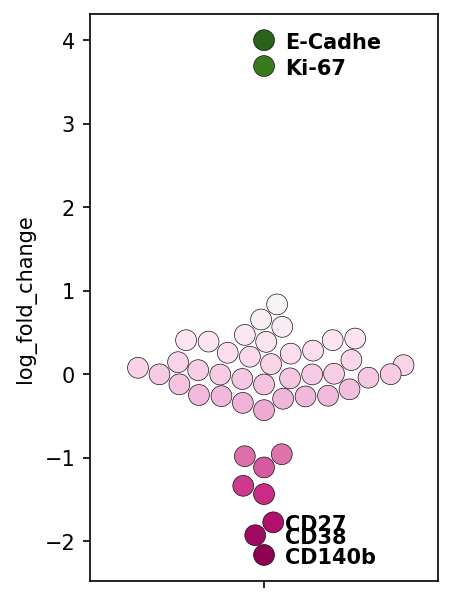

In [275]:
import matplotlib.cm as cm

df = df.sort_values(by='log_fold_change', ascending=False)

cmap = cm.get_cmap('PiYG')
norm = plt.Normalize(-2, 2)
plt.figure(figsize=(3,5),dpi=150)
sns.swarmplot(y='log_fold_change',  data=df, size=10, palette='PiYG',
              hue='log_fold_change', dodge=False,edgecolor='black', linewidth=0.3)
#disable the legend
plt.legend([],[], frameon=False)

#label the most extreme values
for i in [0,1,-3,-2,-1]:
    print(f"Layer: {df.index[i]} \t log fold change: {df.iloc[i,-1]:.2f}")
    plt.text(0.06, df.iloc[i,-1]-.1, df.index[i], horizontalalignment='left', size='medium', color='black', weight='semibold')


Let's have a look at the actual image data of these 5 channels!

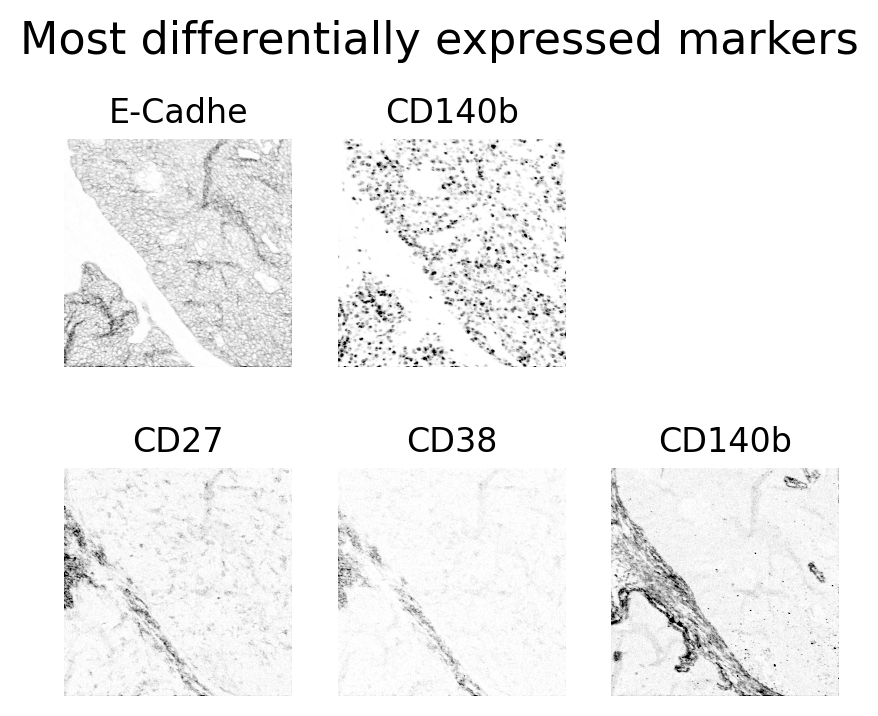

In [273]:
#make subplots for the two most extreme markers
fig, axes = plt.subplots(2, 3, figsize=(5, 4),dpi=200)
axes = axes.flatten()
axes[0].imshow(viewer.layers[df.index[0]].data, cmap='gray_r', vmin=0, vmax=200)
axes[0].set_title(df.index[0])
axes[1].imshow(viewer.layers[df.index[1]].data, cmap='gray_r', vmin=0, vmax=200)
axes[1].set_title(df.index[-1])
#add title to the figure

axes[3].imshow(viewer.layers[df.index[-3]].data, cmap='gray_r', vmin=0, vmax=20)
axes[3].set_title(df.index[-3])
axes[4].imshow(viewer.layers[df.index[-2]].data, cmap='gray_r', vmin=0, vmax=20)
axes[4].set_title(df.index[-2])
axes[5].imshow(viewer.layers[df.index[-1]].data, cmap='gray_r', vmin=0, vmax=20)
axes[5].set_title(df.index[-1])

# disable the axis
for ax in axes:
    ax.axis('off')

#add title to the figure
plt.suptitle('Most differentially expressed markers', fontsize=16, y=1.0)
plt.show()